In [104]:
%matplotlib inline
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
import pickle

In [17]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [18]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
df['BMI'].replace(0,df['BMI'].median(),inplace=True)
df['BloodPressure'].replace(0,df['BloodPressure'].median(),inplace=True)
df['SkinThickness'].replace(0,df['SkinThickness'].median(),inplace=True)
df['Insulin'].replace(0,df['Insulin'].median(),inplace=True)
df['Glucose'].replace(0,df['Glucose'].median(),inplace=True)
# Replacing the zero with the mean and note that Pregnancies can be zero as it is possible that some person is not perganent

In [20]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

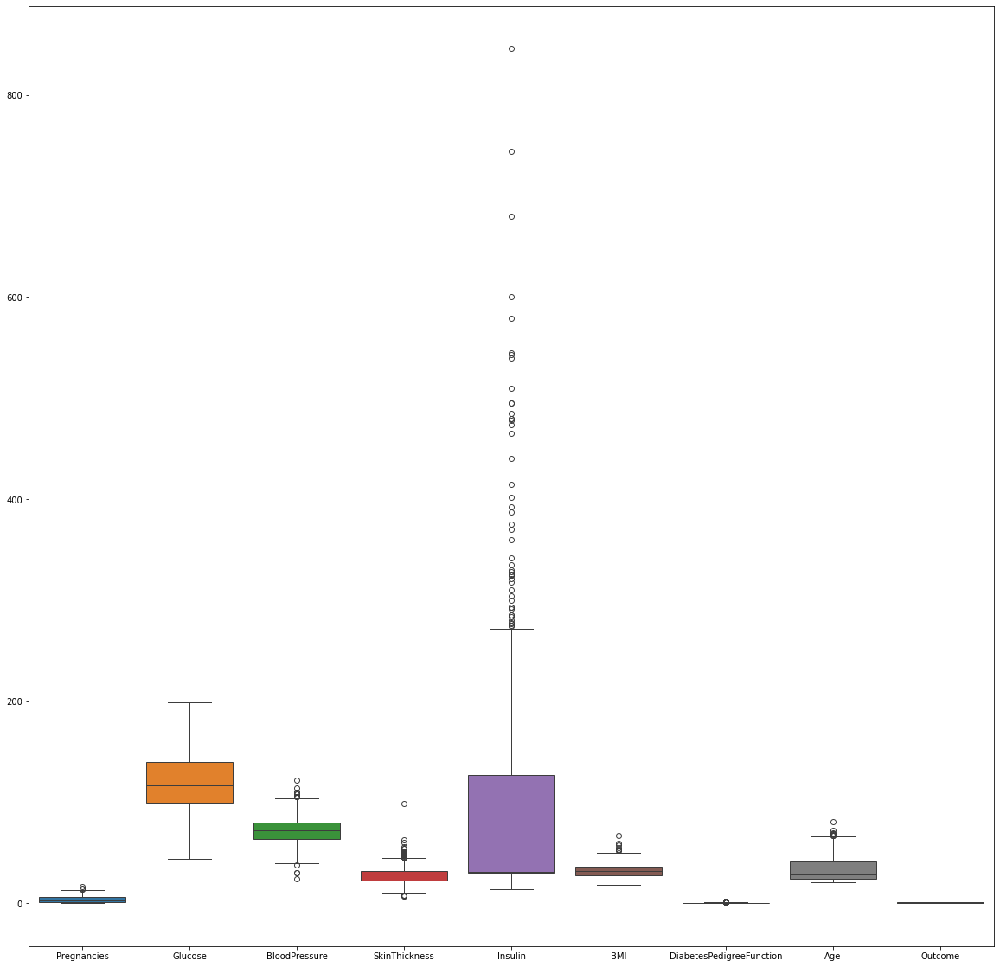

In [21]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

In [60]:
df_new=df

In [61]:
q = df_new['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df_new['BMI'].quantile(.99)
df_new = df_new[df_new['BMI']< q]

q = df_new['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness']< q]

q = df_new['Insulin'].quantile(.95)
df_new = df_new[df_new['Insulin']< q]

q = df_new['DiabetesPedigreeFunction'].quantile(.99)
df_new = df_new[df_new['DiabetesPedigreeFunction']< q]

q = df_new['Age'].quantile(.99)
df_new = df_new[df_new['Age']< q]


In [62]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,30.5,33.6,0.627,50,1
1,1,85,66,29,30.5,26.6,0.351,31,0
2,8,183,64,23,30.5,23.3,0.672,32,1
3,1,89,66,23,94.0,28.1,0.167,21,0
5,5,116,74,23,30.5,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180.0,32.9,0.171,63,0
764,2,122,70,27,30.5,36.8,0.340,27,0
765,5,121,72,23,112.0,26.2,0.245,30,0
766,1,126,60,23,30.5,30.1,0.349,47,1


<Axes: >

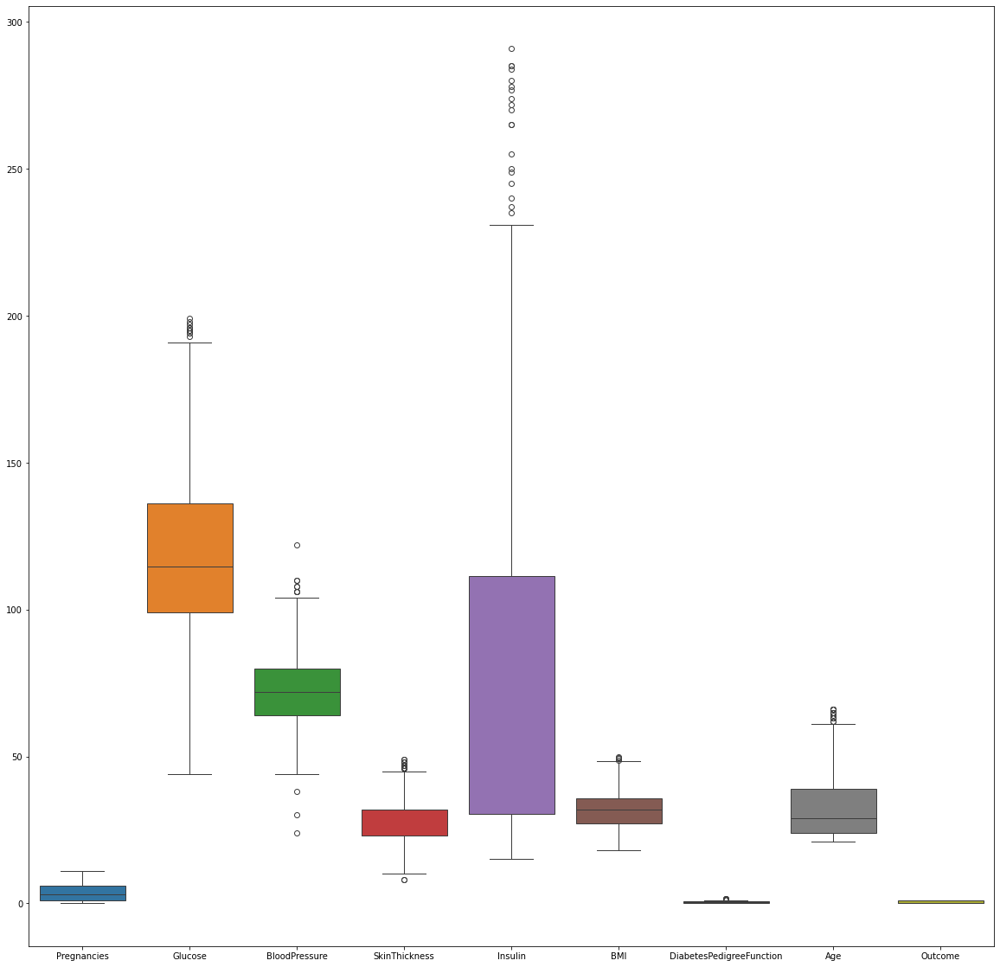

In [63]:
fig,ax=plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new,ax=ax)

In [64]:
x=df_new.drop(columns=['Outcome'])
y=df_new['Outcome']

In [66]:
scalar=StandardScaler()
x_scaled=scalar.fit_transform(x)

In [67]:
def vif_score(x):
    scaler  = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])

In [69]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.456545
1,Glucose,1.248455
2,BloodPressure,1.266151
3,SkinThickness,1.493086
4,Insulin,1.220668
5,BMI,1.540574
6,DiabetesPedigreeFunction,1.051967
7,Age,1.663956


In [81]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled , y , test_size = .20 , random_state = 144)

In [83]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear')

In [84]:
logr_liblinear.fit(x_train,y_train )

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [86]:
logr_liblinear.predict_proba([x_test[1]])

array([[0.92524293, 0.07475707]])

In [87]:
logr_liblinear.predict_log_proba([x_test[1]])

array([[-0.07769895, -2.59351153]])

In [88]:
logr_liblinear.predict([x_test[1]])

array([0], dtype=int64)

In [89]:
y_predict = logr_liblinear.predict(x_test)

In [90]:
confusion = confusion_matrix(y_test,y_predict)

In [91]:
confusion

array([[76, 11],
       [24, 24]], dtype=int64)

In [92]:
def model_eval(y_true,y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy=(tp+tn)/(tp+tn+fp+fn)
    precision=tp/(tp+fp)
    recall=tp/(tp+fn)
    specificity=tn/(fp+tn)
    F1_Score = 2*(recall * precision) / (recall + precision)
    result={"Accuracy":accuracy,"Precision":precision,"Recall":recall,'Specficity':specificity,'F1':F1_Score}
    return result

In [93]:
model_eval(y_test,y_predict)

{'Accuracy': 0.7407407407407407,
 'Precision': 0.6857142857142857,
 'Recall': 0.5,
 'Specficity': 0.8735632183908046,
 'F1': 0.5783132530120482}

In [96]:
auc = roc_auc_score(y_test,y_predict)

In [98]:
fpr, tpr, thresholds  = roc_curve(y_test,y_predict)

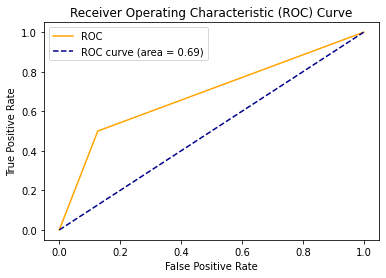

In [102]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [105]:
# Create a LogisticRegressionCV model with L1 (Lasso) penalty
# You can adjust the 'Cs' parameter to control the search space for the regularization strength
model_lasso = LogisticRegressionCV(Cs=10, penalty='l1', solver='liblinear', cv=5)
model_lasso.fit(x_train, y_train)

# Create a LogisticRegressionCV model with L2 (Ridge) penalty
model_ridge = LogisticRegressionCV(Cs=10, penalty='l2', solver='lbfgs', cv=5)
model_ridge.fit(x_train, y_train)

# Create a LogisticRegressionCV model with Elastic Net penalty
# 'l1_ratios' controls the balance between L1 and L2 penalties
model_elasticnet = LogisticRegressionCV(Cs=10, penalty='elasticnet', solver='saga', l1_ratios=[0.1, 0.5, 0.9], cv=5)
model_elasticnet.fit(x_train, y_train)

# Evaluate the models
accuracy_lasso = model_lasso.score(x_test, y_test)
accuracy_ridge = model_ridge.score(x_test, y_test)
accuracy_elasticnet = model_elasticnet.score(x_test, y_test)

print(f'Accuracy (Lasso): {accuracy_lasso}')
print(f'Accuracy (Ridge): {accuracy_ridge}')
print(f'Accuracy (Elastic Net): {accuracy_elasticnet}')

Accuracy (Lasso): 0.7407407407407407
Accuracy (Ridge): 0.7407407407407407
Accuracy (Elastic Net): 0.7407407407407407
